# Theo_Nazon_SDI701_Cover_Type

# // TOOL USED - SCI-KIT LEARN //

## Competition objective
Predict the forest cover type (the predominant kind of tree cover) from strictly cartographic variables (as opposed to remotely sensed data).

## Data provided
Raw form (not scaled) and contains binary columns of data for qualitative independent variables such as wilderness areas and soil type.
We are dealing with a classification problem, containing labeled data (from 1 to 7 corresponding to the different Cover Type). Additionnaly, trainset includes ~500k samples, and data is numeric (we are not dealing with text data for which Naive Bayes could have been favored choice).
Initial thougths leads to consider Ensemble Classifiers (RandomForest, XGBoost, Extratrees). Our goal here will be to compare these classifiers and tune their parameters to reach and optimal solution

## Support
Given algorithms considered for implemententation, choice naturally turned to sci-kit library. Indeed, ExtraTree is not implemented in pyspark ML Libraries

===================================================================================================================

## Workflow
0. Data Loading
1. Data Preprocessing
	- Objective : Prepare data for visualization and training part.
	- Comment : Data is already very well processed (binary columns etc.) though it is not normalized. We will leave it as it is as we consider using decision tree based classifier which do not require normalization
2. Data visualization
	- Objective : Identify most important variables for possible feature engineering
	- Comment : Data already contains around XX features. Data visualization will help us assess if some variable are particularly important (as defined by the various classification models – see Jupyter Notebook for further details), and/or if we can drop some non-important feature that could lead to model over-fititing
3. Feature engineering
	- Objective : Increase model performance
D) Training modeling
	Comment : We will first try out a Random Forest Classifier on the train set. Reasons being : I) it is the one I understand the most clearly and I’d rather use something I understand first, ii) it also measures feature importance which will be used in part ii) and iii).

===================================================================================================================

### Key take-away

- Ensemble Classifier do a great job at classifying this data, reaching 94% and ~96% using Random Forest and ExtraTreeClassifier
- Hyperparameter tuning helps improve scores by [2% - 5%]
- Engineered features improves marginally models performances:
    - Geological / Climatic Zone have no to negative impact on performance, certainly explained by the very low importance level of Soil Type for predicting the cover type
    - Filling up Hillshade_3pm has no impact, which was anticipated considering the very small amount of negative or zero values
- Running time is faster in ExtraClassifier compared to Random Forest
- Both algorithm are very easy to use : 
    - Manage not scaled data / categorical / binary / continuous data
    - Require few parameter tuning work
    - Prevent overfitting through the use of bagging / random features selection / random sampling

===================================================================================================================

### Import

In [53]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

from scipy.interpolate import BSpline
import numpy as np
import math as m
import random
import scipy.stats as stats
from scipy.stats import norm

import matplotlib.lines as mlines

import statistics as stat
from sklearn import ensemble

from pandas.plotting import scatter_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score
from sklearn.ensemble import ExtraTreesClassifier


import statsmodels as sm

%matplotlib inline

plt.style.use('seaborn')
sns.set_style('darkgrid')

# Ignore message error arising on sns.pairplot
np.seterr(divide='ignore', invalid='ignore')

{'divide': 'ignore', 'invalid': 'ignore', 'over': 'warn', 'under': 'ignore'}

# <font color='#486696'>0. DATA LOADING</font>

#### <font color='#6e97d8'>Setting seed parameters</font>

In [54]:
train_test_seed = 0

#### <font color='#6e97d8'>Loading train and test datasets provided by Kaggle</font>

In [55]:
train = pd.read_csv("/home/theo/Dropbox/01. MASTER TELECOM PARIS/01. SD701 - Exploration de grands volumes de données/Final_Test/train-set.csv")

In [56]:
test = pd.read_csv("/home/theo/Dropbox/01. MASTER TELECOM PARIS/01. SD701 - Exploration de grands volumes de données/Final_Test/test-set.csv")

#### <font color='#6e97d8'>Loading additional data from US Forest Service on climatic zone and geological zonetrain</font>

In [57]:
geological_zone = pd.read_csv("/home/theo/Dropbox/01. MASTER TELECOM PARIS/01. SD701 - Exploration de grands volumes de données/Final_Test/geological_zone.csv")
climatic_zone = pd.read_csv("/home/theo/Dropbox/01. MASTER TELECOM PARIS/01. SD701 - Exploration de grands volumes de données/Final_Test/climatic_zone.csv")                 
usfs_corr_tab = pd.read_csv("/home/theo/Dropbox/01. MASTER TELECOM PARIS/01. SD701 - Exploration de grands volumes de données/Final_Test/usfs_elu_code.csv", sep=";")

# <font color='#486696'>1. DATA PREPROCESSING</font>

#### <font color='#6e97d8'>Creating a DataFrame containing the cover type indices and the corresponding labels for vizualisation purpose</font>

In [58]:
cover_type = train["Cover_Type"].unique()
cover_type.sort(axis=0)
cover_type = cover_type.tolist()

In [59]:
cover_colors = ["lightseagreen", "sandybrown", "lightgreen", "aquamarine", "darkgoldenrod", "lightsteelblue", "tomato"]
cover_labels = ["Spruce/Fir", "Lodgepole Pine", "Ponderosa Pine", "Cottonwood/Willow", "Aspen", "Douglas-fir", "Krummholz"]

In [60]:
df_cover_type = pd.DataFrame({"cover_indice" : cover_type, "cover_label" : cover_labels, "cover_color" : cover_colors})

#### <font color='#6e97d8'>Adding a column containing the labels of the cover type in the train DataFrame</font>

In [61]:
train['Cover_Type_lab'] = train['Cover_Type'].map(df_cover_type.set_index('cover_indice')['cover_label'])

#### <font color='#6e97d8'>Saving train/test ID column in a Series before dropping the column from the train DataFrame (not a feature not be considered)</font>

In [62]:
ID_train = train["Id"]
train.drop('Id', axis=1, inplace=True)

In [63]:
ID_test = test["Id"]
test.drop("Id", axis=1, inplace=True)

#### <font color='#6e97d8'>Creating the feature matrix X and the observation vector Y from the train dataset</font>

In [64]:
X = train.drop(["Cover_Type", "Cover_Type_lab"], axis=1)
Y = train["Cover_Type"]

# <font color='#486696'>2. DATA VISUALIZATION</font>

## <font color='#6e97d8'>2.1 Approach</font>

We are dealing with a classification problem. A first step prior to (if relevant) proceed with feature engineering is to analyse the most important variable and the correlation between them

To do so, we will train a basic Random Forest Classifier on the train data, and analyse the most important features

In [14]:
initial_rf_clf = RandomForestClassifier(n_estimators=200, max_depth=40, random_state=0, n_jobs=-1)
initial_rf_clf.fit(X, Y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=40, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=-1,
            oob_score=False, random_state=0, verbose=0, warm_start=False)

The following command will extract the importance of each feature after the Random Forest classifier has been trained on the data 

"Feature importance is calculated as the decrease in node impurity weighted by the probability of reaching that node. The node probability can be calculated by the number of samples that reach the node, divided by the total number of samples. The higher the value the more important the feature."

In [15]:
features_importance = initial_rf_clf.feature_importances_

## <font color='#6e97d8'>2.2 Plotting the Top 10 features by importance</font>

##### <font color='#6e97d8'>Creating a DataFrame containing the features, their importance, ordered by decreasing order</font>

In [19]:
# Removing Cover_Type indices and labels from the train columns to get the features labels
features_labels = train.columns[:-2]

In [20]:
df_features = pd.DataFrame({"feature" : features_labels, "importance" : features_importance})

In [21]:
df_features.sort_values("importance", ascending=True, inplace=True)

##### <font color='#6e97d8'>Creating a DataFrame containing the Top 10 features by order of importance and plotting them</font>

In [22]:
df_top10_features = df_features.tail(10)

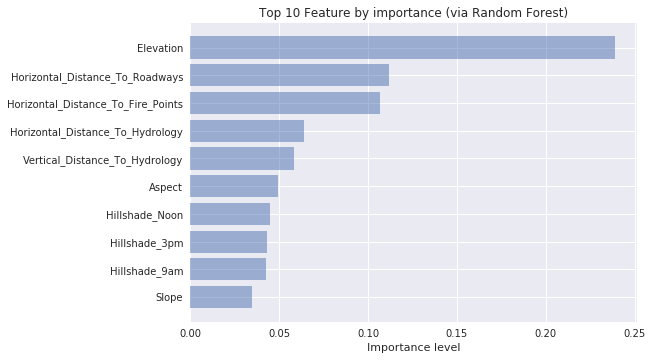

In [23]:
y_pos = np.arange(df_top10_features.shape[0])
 
plt.barh(y_pos, df_top10_features["importance"], align='center', alpha=0.5)
plt.yticks(y_pos, df_top10_features["feature"])
plt.xlabel('Importance level')
plt.title('Top 10 Feature by importance (via Random Forest)')
 
plt.show()

===================================================================================================================

### Key take-away
- Using a RandomForestClassifier to get the feature importance in the classification process, | Elevation | is clearly a determining factor in the process of determining the cover type. Next step would be to plot the covariance plot of the most important features to identify if there are any correlation / relationship that could push for relevant feature engineering
- The 10 continuous features are topping the ranking. Reversely, soil_type does not position itself as an important feature

===================================================================================================================

## <font color='#6e97d8'>2.3 Plotting the correlation matrix of the Top 10 features by importance</font>

In [24]:
columns_to_select = df_top10_features["feature"].append(pd.Series("Cover_Type_lab"))

In [25]:
train_top10 = train[columns_to_select]

/home/theo/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


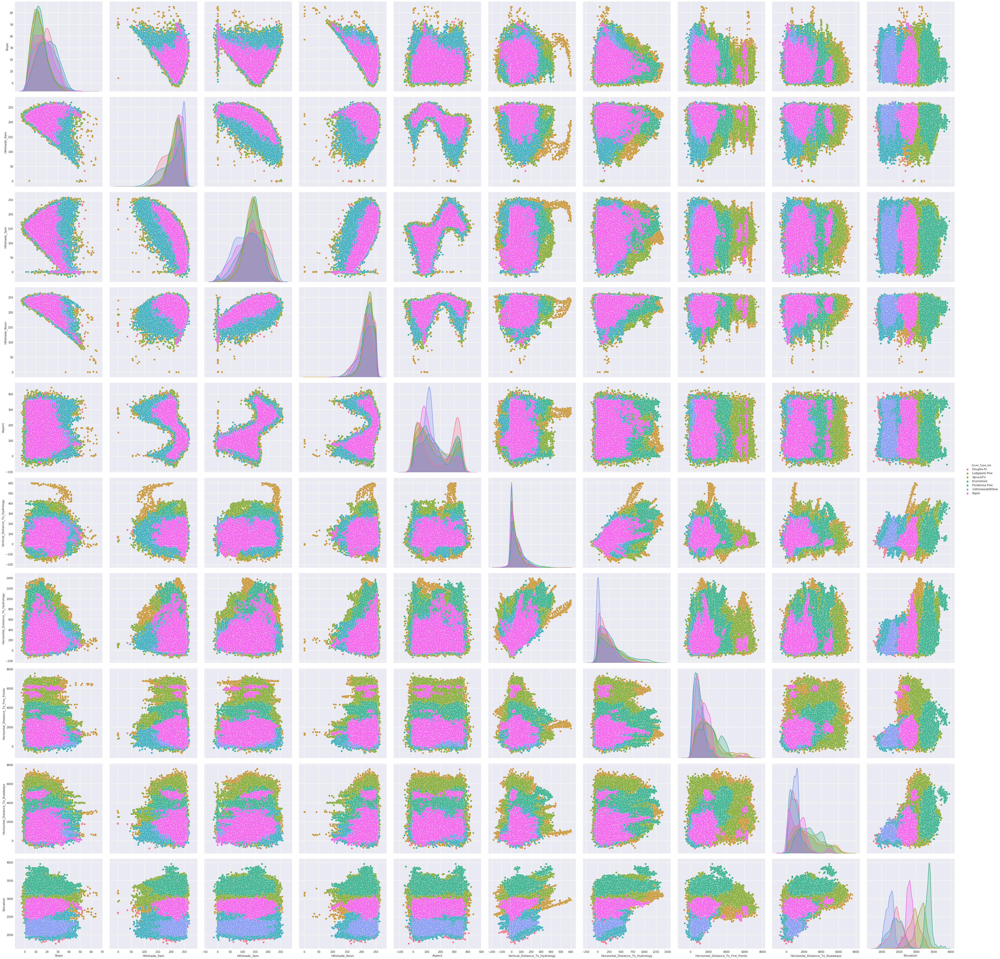

In [26]:
matrix = sns.pairplot(train_top10, size=5, hue="Cover_Type_lab", diag_kind="kde", diag_kws=dict(shade=True))
plt.tick_params(labelsize=10)
plt.show()

## <font color='#6e97d8'>2.4 Distribution of top 10 features</font>

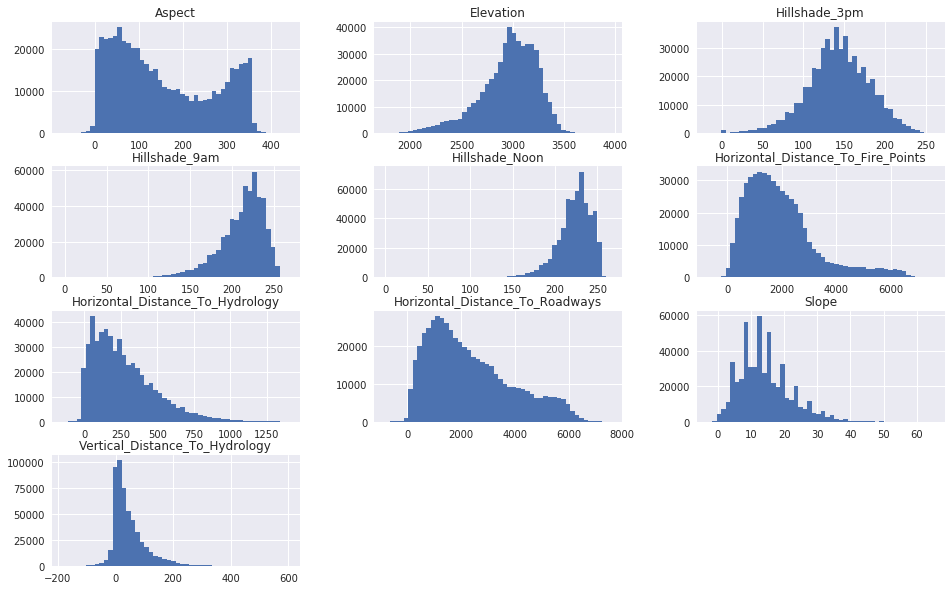

In [27]:
train_top10.hist(figsize=(16,10), bins=50)
plt.show()

===================================================================================================================

## <font color='#6e97d8'>2.5 Plotting distribution of elevation by Cover type</font>

/home/theo/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1706: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


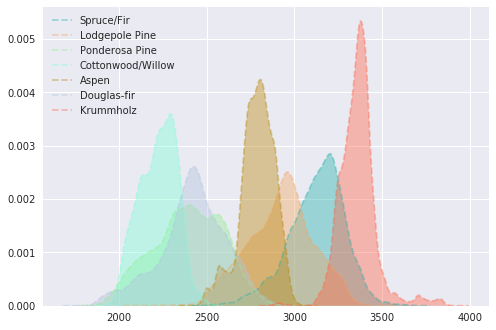

In [27]:
for i, cover_type in enumerate(cover_type):
    p1=sns.kdeplot(train[train["Cover_Type"] == cover_type]['Elevation'], linestyle="--", alpha=0.4, shade=True, color=cover_colors[i], label=cover_labels[i], legend=False, gridsize=200)
plt.legend(loc='upper left')
sns.color_palette("Blues")
plt.show()

===================================================================================================================

## <font color='#6e97d8'>2.6 Plotting correlated features with Pearson_Coef > 0.4</font>

Complementing correlation matrix, we plot the features couple for which pearson correlation coefficient is above 0.4 (considered here as an - arbitrary - threshold for "significant" correlation) 

Pearson correlation can be claculated on continuous data, hence we will consider the first 10 features in the order of display that are actually continuous (non-categorical) 

In [15]:
max_index_of_continous_feature = 10 

train_pearson = train.iloc[:,:max_index_of_continous_feature] 

columns_names = train_pearson.columns 

train_p_corr = train_pearson.corr()

threshold = 0.4

corr_list = []

for i in range(0,max_index_of_continous_feature):
    for j in range(i+1,max_index_of_continous_feature):
        if (train_p_corr.iloc[i,j] >= threshold and train_p_corr.iloc[i,j] < 1) or (train_p_corr.iloc[i,j] < 0 and train_p_corr.iloc[i,j] <= -threshold):
            corr_list.append([train_p_corr.iloc[i,j],i,j])

corr_list_sorted = sorted(corr_list,key=lambda x: -abs(x[0]))

for v,i,j in corr_list_sorted:
    print ("%s and %s = %.2f" % (columns_names[i],columns_names[j],v))


Hillshade_9am and Hillshade_3pm = -0.78
Aspect and Hillshade_3pm = 0.64
Horizontal_Distance_To_Hydrology and Vertical_Distance_To_Hydrology = 0.60
Hillshade_Noon and Hillshade_3pm = 0.59
Aspect and Hillshade_9am = -0.58
Slope and Hillshade_Noon = -0.52


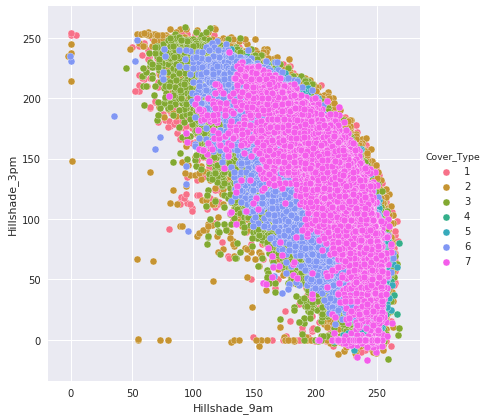

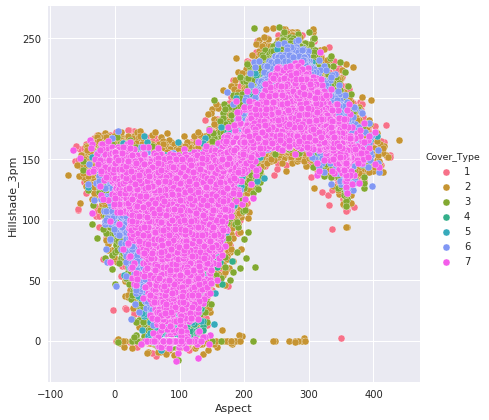

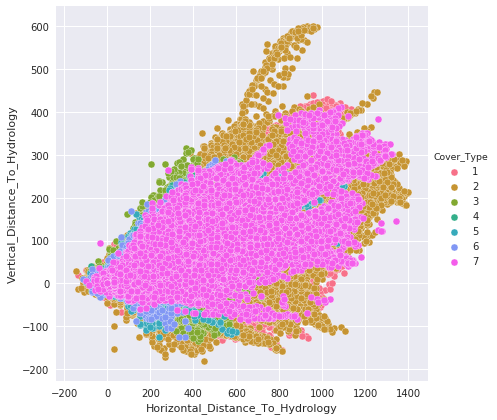

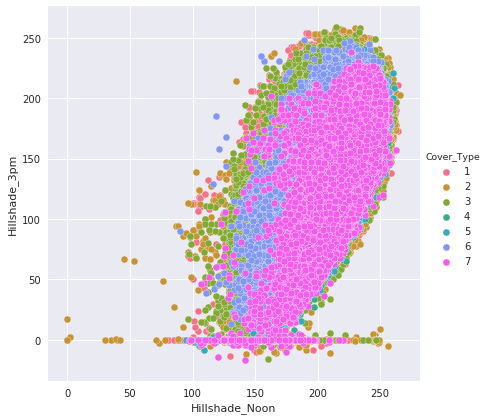

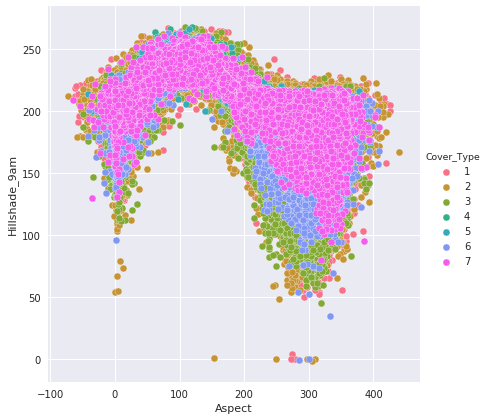

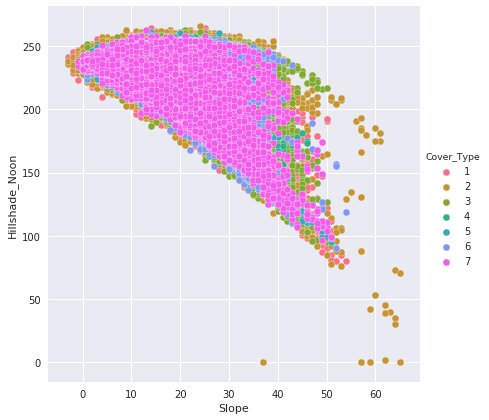

In [18]:
for v,i,j in corr_list_sorted:
    sns.pairplot(train, hue="Cover_Type_lab", size=6, x_vars=columns_names[i], y_vars=columns_names[j])
    plt.show()

===================================================================================================================

### Key take-away

- Data on Hillshade_3pm needs to be refined / reviewed. There are numerous datapoints with Hillshade_3pm =0, no corresponding to the overall relationship with Hillshade_9pm or Hillshade_Noon
- See Section 3 - Feature Engineering / DataCleaning for how to deal with this.

===================================================================================================================

------------------------------------------------------------------------

# <font color='#486696'>3. FEATURE ENGINEERING / DATA CLEANING</font>

- Overall, a lot of data cleaning has already been done. Categorical data has been binarized
- Preliminary Data analysis shows that the 10 continuous (or simili-continuous) features are the most important ones in the train set
- Further work can be done on feature engineering, namely : 
    - Filling up odd values doing a regression on the data 
    - Combining important features with themselves : polynamial, logarithmic, square root transformation
    - Combining important features between themselves : product / sum / difference of paris

## <font color='#6e97d8'>3.1 Cleaning Hillshade Data</font>

### <font color='#6e97d8'>3.1.1 Assessing situation - what are talking about in terms of #?</font>

- By definition, Hillshade values belong to [0, 255]. A negative value or a value beyond 255 suggests an error.
- Additionnaly, cf. Section 2.6, data for feature Hillshade_3pm needs to be reviewed, with numerous datapoints at 0

In [65]:
print("-------------------------------------------------------------------")
print("Number of data points with values equals or less than 0")
print("Number of values <=0 for Hillshade_9am   : %.0f" %train["Hillshade_9am"][train["Hillshade_9am"] <= 0].shape[0])
print("Number of values <=0 for Hillshade_Noon  : %.0f" %train["Hillshade_Noon"][train["Hillshade_Noon"] <= 0].shape[0])
print("Number of values <=0 for Hillshade_3pm   : %.0f" %train["Hillshade_3pm"][train["Hillshade_3pm"] <= 0].shape[0])
print("-------------------------------------------------------------------")
print("Number of data points with values equals more than 255")
print("Number of values >255 for Hillshade_9am  : %.0f" %train["Hillshade_9am"][train["Hillshade_9am"] > 255].shape[0])
print("Number of values >255 for Hillshade_Noon : %.0f" %train["Hillshade_Noon"][train["Hillshade_Noon"] > 255].shape[0])
print("Number of values >255 for Hillshade_3pm  : %.0f" %train["Hillshade_3pm"][train["Hillshade_3pm"] > 255].shape[0])

-------------------------------------------------------------------
Number of data points with values equals or less than 0
Number of values <=0 for Hillshade_9am   : 9
Number of values <=0 for Hillshade_Noon  : 4
Number of values <=0 for Hillshade_3pm   : 1131
-------------------------------------------------------------------
Number of data points with values equals more than 255
Number of values >255 for Hillshade_9am  : 430
Number of values >255 for Hillshade_Noon : 735
Number of values >255 for Hillshade_3pm  : 8


Key take-away : the number of ill-set data is quite small relatively to train dataset (<<< 1%). Still, partly for the sake of the exercice, I will fill in <=0 values using a regression

### <font color='#6e97d8'>3.1.2 Defining approach</font>

Several approaches can be used to fill in None or incorrect values : 
- Delete entries from dataset: in our situations, it would not significanlty impact the modelling process as we are talking of around XXXXXXXXXXXXX% of the whole datasets
- Input the mean / median / mode of dataset
- If data belongs to a range [0, 255] here : re-scale the data
- Perform a regression on dataset : following reading this article (http://blog.kaggle.com/2017/01/23/a-kaggle-master-explains-gradient-boosting/), we will try and implement Gradient Boosting Regression on this particular task

### <font color='#6e97d8'>3.1.3 Gradient Boosting Regression to predict Hillshade_3pm value</font>

In [66]:
pd.options.mode.chained_assignment = None  # default='warn'

In [67]:
# Converting train dataset format to a user-friendly form to predict Hillshade_3pm
train_3pm = train.drop(["Cover_Type", "Cover_Type_lab"], axis=1)

In [68]:
# Creating new column reviewed replacing allnegative values by 0
train_3pm["Hillshade_3pm_reviewed"] = train_3pm["Hillshade_3pm"]

In [69]:
train_3pm["Hillshade_3pm_reviewed"].clip(lower=0)
train_3pm.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Hillshade_3pm_reviewed
0,2611,326,20,120,27,1597,168,214,184,2913,...,0,0,0,0,0,0,0,0,0,184
1,2772,324,17,42,7,1814,175,220,183,2879,...,0,0,0,0,0,0,0,0,0,183
2,2764,4,14,480,-21,700,201,212,148,700,...,0,0,0,0,0,0,0,0,0,148
3,3032,342,9,60,8,4050,202,227,164,2376,...,0,0,0,0,0,0,0,0,0,164
4,2488,23,11,117,21,1117,209,218,151,1136,...,0,0,0,0,0,0,0,0,0,151


In [70]:
X_3pm      = train_3pm[train_3pm["Hillshade_3pm_reviewed"] > 0].drop("Hillshade_3pm_reviewed", axis=1)
y_3pm      = train_3pm[train_3pm["Hillshade_3pm_reviewed"] > 0]["Hillshade_3pm_reviewed"]
X_3pm_null = train_3pm[train_3pm["Hillshade_3pm_reviewed"] == 0].drop("Hillshade_3pm_reviewed", axis=1)
y_3pm_null = train_3pm[train_3pm["Hillshade_3pm_reviewed"] == 0]["Hillshade_3pm_reviewed"]

In [71]:
X_3pm_train, X_3pm_test, y_3pm_train, y_3pm_test = train_test_split(X_3pm, y_3pm, test_size=0.20, random_state=train_test_seed)

In [72]:
from sklearn.ensemble import GradientBoostingRegressor

gradient_rgr = GradientBoostingRegressor(n_estimators=1000, verbose=1)
gradient_rgr.fit(X_3pm_train, y_3pm_train)

      Iter       Train Loss   Remaining Time 
         1        1165.3376           17.61m
         2         952.1858           17.28m
         3         777.7664           17.33m
         4         635.4470           17.23m
         5         519.3534           17.19m
         6         424.6275           17.12m
         7         347.3757           17.10m
         8         284.0785           17.04m
         9         232.3598           16.98m
        10         190.2046           16.94m
        20          26.1677           17.46m
        30           3.8465           17.47m
        40           0.6736           17.35m
        50           0.1965           16.87m
        60           0.1210           16.59m
        70           0.1053           16.17m
        80           0.0975           15.58m
        90           0.0913           14.96m
       100           0.0859           14.36m
       200           0.0399           11.45m
       300           0.0200            9.80m
       40

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_samples_split=2, min_weight_fraction_leaf=0.0,
             n_estimators=1000, presort='auto', random_state=None,
             subsample=1.0, verbose=1, warm_start=False)

In [73]:
print("R^2 score on training set: %0.2f" % gradient_rgr.score(X_3pm_train, y_3pm_train))
print("R^2 score on test set    : %0.2f" % gradient_rgr.score(X_3pm_test, y_3pm_test))

R^2 score on training set: 1.00
R^2 score on test set    : 1.00


===================================================================================================================

### <font color='#6e97d8'>3.1.5 Replicate on Test data</font>

In [74]:
# Converting train dataset format to a user-friendly form to predict Hillshade_3pm
test_3pm = test.copy()

# Creating new column reviewed replacing allnegative values by 0
test_3pm["Hillshade_3pm_reviewed"] = test_3pm["Hillshade_3pm"]

test_3pm["Hillshade_3pm_reviewed"].clip(lower=0)

X_3pm_test      = test_3pm[test_3pm["Hillshade_3pm_reviewed"] > 0].drop("Hillshade_3pm_reviewed", axis=1)
y_3pm_test      = test_3pm[test_3pm["Hillshade_3pm_reviewed"] > 0]["Hillshade_3pm_reviewed"]
X_3pm_null_test = test_3pm[test_3pm["Hillshade_3pm_reviewed"] == 0].drop("Hillshade_3pm_reviewed", axis=1)
y_3pm_null_test = test_3pm[test_3pm["Hillshade_3pm_reviewed"] == 0]["Hillshade_3pm_reviewed"]

X_3pm_train, X_3pm_test, y_3pm_train, y_3pm_test = train_test_split(X_3pm_test, y_3pm_test, test_size=0.20, random_state=train_test_seed)


gradient_rgr_test = GradientBoostingRegressor(n_estimators=1000, verbose=1)
gradient_rgr_test.fit(X_3pm_train, y_3pm_train)

print("R^2 score on training set: %0.2f" % gradient_rgr_test.score(X_3pm_train, y_3pm_train))
print("R^2 score on test set    : %0.2f" % gradient_rgr_test.score(X_3pm_test, y_3pm_test))

      Iter       Train Loss   Remaining Time 
         1        1169.4973            6.83m
         2         955.6794            7.69m
         3         780.5010            7.67m
         4         637.8127            7.38m
         5         521.1560            7.20m
         6         426.1474            7.04m
         7         348.5312            6.92m
         8         285.1527            6.84m
         9         233.2588            6.76m
        10         190.8778            6.71m
        20          26.3010            6.66m
        30           3.8622            6.37m
        40           0.6700            6.17m
        50           0.1944            5.99m
        60           0.1193            5.82m
        70           0.1029            5.62m
        80           0.0924            5.36m
        90           0.0873            5.07m
       100           0.0833            4.83m
       200           0.0402            3.61m
       300           0.0204            3.05m
       40

===================================================================================================================

### Key take-away

Gradient Boosting Regressor performed well on both training and test set to predict Hillshade_3pm. It is a good predictor to fill in missing or NaN values for Hillshade_3pm, which we will do right now

===================================================================================================================

### <font color='#6e97d8'>3.1.4 Finalize work: filling in the predicted value for null entries in train dataset</font>

In [75]:
prediction_for_null_values = gradient_rgr.predict(X_3pm_null)

In [76]:
train_3pm[train_3pm["Hillshade_3pm_reviewed"] == 0]["Hillshade_3pm_reviewed"] = prediction_for_null_values

In [77]:
train["Hillshade_3pm"] = train_3pm["Hillshade_3pm_reviewed"]

In [78]:
prediction_for_null_values_test = gradient_rgr_test.predict(X_3pm_null_test)

In [79]:
test_3pm[test_3pm["Hillshade_3pm_reviewed"] == 0]["Hillshade_3pm_reviewed"] = prediction_for_null_values_test

In [80]:
test["Hillshade_3pm"] = test_3pm["Hillshade_3pm_reviewed"]

## <font color='#6e97d8'> 3.2 Creation of Distance_To_Hydrology</font>

We create an additional variable synthesizing both feature, which will be the Euclidean distance to a water point, more precisely:
sqrt(Horizontal_Distance_To_Hydrology^2 + Vertical_Distance_To_Hydrology^2

In [81]:
def compute_distance(row):
    return m.sqrt(row["Horizontal_Distance_To_Hydrology"]**2 + row["Vertical_Distance_To_Hydrology"]**2)

In [82]:
train["Distance_To_Hydrology"] = train.apply(compute_distance, axis=1)

In [83]:
test["Distance_To_Hydrology"] = test.apply(compute_distance, axis=1)

## <font color='#6e97d8'>3.3 Combination of features with themselves</font>

In [84]:
train["ln_elevation"] = train["Elevation"].apply(lambda x: np.log(x) if x >= 0 else -np.log(abs(x)))
train["sqr_hill_3pm"] = train["Hillshade_3pm"].apply(lambda x: np.power(x,2))
train["sqr_hill_Noon"] = train["Hillshade_Noon"].apply(lambda x: np.power(x,2))
train["sqr_hill_9am"] = train["Hillshade_9am"].apply(lambda x: np.power(x,2))

==================================================================================================================

In [85]:
test["ln_elevation"] = test["Elevation"].apply(lambda x: np.log(x) if x >= 0 else -np.log(abs(x)))
test["sqr_hill_3pm"] = test["Hillshade_3pm"].apply(lambda x: np.power(x,2))
test["sqr_hill_Noon"] = test["Hillshade_Noon"].apply(lambda x: np.power(x,2))
test["sqr_hill_9am"] = test["Hillshade_9am"].apply(lambda x: np.power(x,2))

## <font color='#6e97d8'>3.4 Average distance to Water, Fire and Roadways</font>

In [86]:
train["Avg_Distance_Water_Fire_Road"] = train[["Horizontal_Distance_To_Roadways", "Horizontal_Distance_To_Fire_Points", "Distance_To_Hydrology"]].mean(axis=1)

In [87]:
test["Avg_Distance_Water_Fire_Road"] = test[["Horizontal_Distance_To_Roadways", "Horizontal_Distance_To_Fire_Points", "Distance_To_Hydrology"]].mean(axis=1)

## <font color='#6e97d8'>3.6 Creation of average Hillshade</font>

The 3 Hillshade features appear in top 10 features by importance in Section 2. It makes sense to create a feature concatenating the three information. We create this after modifying Hillshade_3pm in Section 3.5

In [88]:
train["Avg_Hillshade"] = train[['Hillshade_9am', "Hillshade_Noon", "Hillshade_3pm"]].mean(axis=1)

In [89]:
test["Avg_Hillshade"] = test[['Hillshade_9am', "Hillshade_Noon", "Hillshade_3pm"]].mean(axis=1)

## <font color='#6e97d8'>3.7 Creation of cosinus of slope</font>

In [90]:
test["cos_slope"] = test["Slope"].apply(lambda x: m.cos(x))
train["cos_slope"] = train["Slope"].apply(lambda x: m.cos(x))


## <font color='#6e97d8'>3.8 Other combinations</font>

In [91]:
def product_hill_3N(row):
    return row["Hillshade_3pm"] * row["Hillshade_Noon"]

In [92]:
train["Prod_Hill_3N"] = train.apply(product_hill_3N, axis=1)

In [93]:
test["Prod_Hill_3N"] = test.apply(product_hill_3N, axis=1)

In [94]:
def product_hill_39(row):
    return row["Hillshade_3pm"] * row["Hillshade_9am"]

In [95]:
train["Prod_Hill_39"] = train.apply(product_hill_39, axis=1)

In [96]:
test["Prod_Hill_39"] = test.apply(product_hill_39, axis=1)

In [97]:
def product_hill_9N(row):
    return row["Hillshade_Noon"] * row["Hillshade_9am"]

In [98]:
train["Prod_Hill_9N"] = train.apply(product_hill_9N, axis=1)

In [99]:
test["Prod_Hill_9N"] = test.apply(product_hill_9N, axis=1)

In [100]:
def diff_hill_3N(row):
    return row["Hillshade_3pm"] * row["Hillshade_Noon"]

In [101]:
train["Diff_Hill_3N"] = train.apply(diff_hill_3N, axis=1)

In [102]:
test["Diff_Hill_3N"] = test.apply(diff_hill_3N, axis=1)

In [103]:
def diff_hill_39(row):
    return row["Hillshade_3pm"] * row["Hillshade_9am"]

In [104]:
train["Diff_Hill_39"] = train.apply(diff_hill_39, axis=1)

In [105]:
test["Diff_Hill_39"] = test.apply(diff_hill_39, axis=1)

In [106]:
def diff_hill_9N(row):
    return row["Hillshade_Noon"] * row["Hillshade_9am"]

In [107]:
train["Diff_Hill_9N"] = train.apply(diff_hill_9N, axis=1)

In [108]:
test["Diff_Hill_9N"] = test.apply(diff_hill_9N, axis=1)

In [115]:
def prod_slop_elev(row):
    return row["Elevation"] * row["Slope"]

In [116]:
train["Slope_Elev"] = train.apply(prod_slop_elev, axis=1)

In [117]:
test["Slope_Elev"] = test.apply(prod_slop_elev, axis=1)

------------------------------------------------------------------------

## <font color='#6e97d8'>3.9 Reinitialization train and test data</font>

In [118]:
X = train.drop(["Cover_Type", "Cover_Type_lab"], axis=1)
Y = train["Cover_Type"]

In [119]:
X.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Avg_Distance_Water_Fire_Road,Avg_Hillshade,cos_slope,Prod_Hill_3N,Prod_Hill_39,Prod_Hill_9N,Diff_Hill_3N,Diff_Hill_39,Diff_Hill_9N,Slope_Elev
0,2611,326,20,120,27,1597,168,214,184,2913,...,1544.333333,188.666667,0.408082,39376,30912,35952,39376,30912,52220,52220
1,2772,324,17,42,7,1814,175,220,183,2879,...,1578.526446,192.666667,-0.275163,40260,32025,38500,40260,32025,47124,47124
2,2764,4,14,480,-21,700,201,212,148,700,...,626.819718,187.000000,0.136737,31376,29748,42612,31376,29748,38696,38696
3,3032,342,9,60,8,4050,202,227,164,2376,...,2162.176995,197.666667,-0.911130,37228,33128,45854,37228,33128,27288,27288
4,2488,23,11,117,21,1117,209,218,151,1136,...,790.623226,192.666667,0.004426,32918,31559,45562,32918,31559,27368,27368


In [120]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=train_test_seed)

## <font color='#6e97d8'> 3.8 Useless / Creation of Distance_To_Hydrology</font>

Extracting only Soil Type Columns from data sets

In [16]:
train_for_zone = train.iloc[:, 14:54]
test_for_zone = test.iloc[:, 14:54]

Merging three DataFrames loaded in Section 0 to get for each soil type, corresponding climatic and geological zones

From documentation USFS_ELU_Code : 
- First Digit: climatic zone
- Second digit: geological zone
- Third / Fourth digit : not used

In [17]:
usfs_corr_tab["USFS_ELU_Code"] = usfs_corr_tab["USFS_ELU_Code"].astype(str)
usfs_corr_tab["Climatic_Code"] = usfs_corr_tab["USFS_ELU_Code"].str[0]
usfs_corr_tab["Geological_Code"] = usfs_corr_tab["USFS_ELU_Code"].str[1]
usfs_corr_tab.head()

,Soil_type,USFS_ELU_Code,Description,Climatic_Code,Geological_Code
0,1,2702,"Cathedral family - Rock outcrop complex, extre...",2,7
1,2,2703,"Vanet - Ratake families complex, very stony.",2,7
2,3,2704,"Haploborolis - Rock outcrop complex, rubbly.",2,7
3,4,2705,"Ratake family - Rock outcrop complex, rubbly.",2,7
4,5,2706,"Vanet family - Rock outcrop complex complex, r...",2,7


Getting the soil types code for each obversation

In [19]:
train_soil_type = 1 + (train_for_zone[train_for_zone ==1].apply(lambda train_for_zone: train_for_zone.index.get_loc(train_for_zone.first_valid_index()), axis=1))

In [20]:
train_soil_type_df = pd.DataFrame(train_soil_type)
train_soil_type_df.columns = ["Soil_type"]

In [22]:
train_soil_merge = train_soil_type_df.merge(usfs_corr_tab, how="left", on="Soil_type")

In [24]:
train_completed = train.join(train_soil_merge)

In [25]:
train_completed.drop(["USFS_ELU_Code", "Description"], axis=1, inplace=True)

================================================================================================

In [27]:
test_soil_type = 1 + (test_for_zone[test_for_zone ==1].apply(lambda test_for_zone: test_for_zone.index.get_loc(test_for_zone.first_valid_index()), axis=1))

In [28]:
test_soil_type_df = pd.DataFrame(test_soil_type)
test_soil_type_df.columns = ["Soil_type"]

In [30]:
test_soil_merge = test_soil_type_df.merge(usfs_corr_tab, how="left", on="Soil_type")

In [33]:
test_completed = test.join(test_soil_merge)

In [34]:
test_completed.drop(["USFS_ELU_Code", "Description"], axis=1, inplace=True)

In [36]:
train = train_completed.drop("Soil_type", axis=1)

In [37]:
test = test_completed.drop("Soil_type", axis=1)

# <font color='#486696'>3. TRAINING</font>

// WHERE WE ARE AT //
- Section 1 | Data processing and Data visualization helped us assess a few important observations : 
    - Data is clean, binarized, with few outliers
    - Elevation is a key feature
    - Data cleaning has to be done on Hillshade_3pm considering it is an important feature, suffering from some innacurate data points

- Section 2 | Data engineering / Data cleaning
    - 3 new variables have been created :
        - Distance_To_Water point (using Horizontal_Distance_To_Hydrology & Vertical_Distance_To_Hydrology)
        - Average_Hillshade
        - Average_Distance_Fire_Road
        - Comment : based on feature importances
    - Hillshade_3pm has been reviewed, fitting a Gradient Boosting Regressor to the data excluding null values
        - High confidence for predicted data
- NEXT STEPS : Section 3 | Training
    - Objective :
        - Test various ensemble techniques on the train set and determine which approach fits the best
        - Underlying objective : understand these models while using them ! 
    - Approach : 
        - Random Forest
        - XGBoost
        - ExtraTreeClassifier

## <font color='#486696'>3.1 Random Forest</font>

### <font color='#6e97d8'>3.1.1 Random Forest - Approach</font>

Quoting from documentation : “Random forests handle categorical features, extend to the multi-class classification setting, do not require feature scaling, and are able to capture non-linearities and feature interactions.”

Random Forest is a natural candidate to try and train a first model on the train data. Using a large number enough number of trees, one avoid the risk of overfitting the mode. Additionnaly, the number of hyperparameters of importance is quite limited and it appears as a good first approach to tackle the cover type problem

HyperParameters : 
- n_estimators : (=number of trees) the more the better theoritcally, although marginal improvmeent decreases beyond a certain threshold while impacting running time (trial and error lead to 500 as a relevant pick for this project)
- max_depth : deeper the tree, the more splits it has and it captures more information about the data. 


- max_features :  represents the number of features to consider when looking for the best split.
- min_samples_leaf : minimum number of samples required to be at a leaf node. A split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each of the left and right branches.


the number of trees to be used in the Random Forest Classifier model is key. Overview of best practices suggests : i) ~500 trees usually yields good results, ii) increasing the number of trees too much can 

Step-by-step :
- Perform a GridSearch Cross Validation on the train set looking at the following parameters (definition from scikit learn documentation) : 
    - max_depth : [50, 80, 100, 120]
    - max_features : [10, 15, 20, 21, 25, 30]
    - min_samples_leaf : [0.2, 0.5, 1, 5]
- Train the model on train set with a large number of trees (500 - 1000)

Source : https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html,
        https://medium.com/all-things-ai/in-depth-parameter-tuning-for-random-forest-d67bb7e920d

### <font color='#6e97d8'>3.1.2 Random Forest - Parameter Tuning</font>

In [53]:
# Build Parameter Grid
parameter_grid = {"max_depth": [140] ,"max_features": [25, 30], "n_estimators": [10], "n_jobs" : [-1], "min_samples_leaf" : [0.5, 1, 3]}

# Random Forest Classifier
rfc = RandomForestClassifier(verbose=1)

# K-Folds for cross-validation
k_fold = StratifiedKFold(n_splits=3)

# Grid Search Cross Validation
grid_search = GridSearchCV(rfc, scoring="accuracy", param_grid=parameter_grid, cv=k_fold, verbose=1, n_jobs=-1)

# Fit model
model = grid_search.fit(X_train, y_train)

# Best Parameters
best_parameters = grid_search.best_params_

# Result
print("Best score: {}".format(grid_search.best_score_))
print("Best parameters: {}".format(grid_search.best_params_))

Fitting 3 folds for each of 6 candidates, totalling 18 fits


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    0.8s finished
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:    1.1s finished
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   41.0s finished
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   42.6s finished
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    0.8s finished
[Parallel(n_jobs=4)]: Done  10 out of  10 | elapsed:    0.8s finished
[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   44.4s finished
[Parallel(n_jo

Best score: 0.9295586510818581
Best parameters: {'max_depth': 140, 'max_features': 30, 'min_samples_leaf': 1, 'n_estimators': 10, 'n_jobs': -1}


[Parallel(n_jobs=-1)]: Done  10 out of  10 | elapsed:   22.0s finished


===================================================================================================================

### Key take-away

- Following iterative process to test the various parameters values, best parameters are the following : Best parameters: {'max_depth': 140, 'max_features': 30, 'min_samples_leaf': 1, 'n_estimators': 10, 'n_jobs': -1}
- More generally, various GridSearch CV (not shown here for simplicity) directs towards high value of max_depth and max_features

===================================================================================================================

### <font color='#6e97d8'>3.1.3 Random Forest - Model Training</font>

In [54]:
rf_clf = RandomForestClassifier(n_estimators=500, max_depth=450, max_features=40, random_state=0, n_jobs=-1)
rf_clf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=140, max_features=30, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
            oob_score=False, random_state=0, verbose=0, warm_start=False)

In [ ]:
# rf_clf = RandomForestClassifier(n_estimators=500, max_depth=140, max_features=30, random_state=0, n_jobs=-1)
# rf_clf.fit(X_train, y_train)
# 0.9170697623591114 output random_forest

In [55]:
y_pred = rf_clf.predict(X_test)

In [58]:
f1_score(y_test, y_pred, average='macro')

0.9170697623591114

### <font color='#6e97d8'>3.1.4 Saving result</font>

In [59]:
submission = pd.DataFrame({"Cover_Type" : rf_clf.predict(test), "Id" : ID_test})

In [60]:
submission = submission.reindex(columns=["Id", "Cover_Type"])

In [61]:
submission.to_csv('output_random_forest.csv', index = None)

===================================================================================================================

### Key take-away

- Random Forest Classifier is a good choice for this classification task
- Tuning RFC hyperparameters allows to optimize the results, going from ~92% to ~94%
- Computer processing capabilities are the only limitations to find the perfect "optimum" given training set
- Increasing max_depth of trees can lead to overfitting (poor results on test data)

===================================================================================================================

## <font color='#486696'>3.2 Gradient Boosting Classifier</font>

### <font color='#6e97d8'>3.2.1 Gradient Boosting Classifier - Approach</font>

===================================

### <font color='#6e97d8'>3.2.2 Gradient Boosting Classifier - Initial training with default parameters</font>

In [34]:
params = {'n_estimators': 100, 'max_depth': 3, 'subsample': 1,
          'learning_rate': 0.05, 'min_samples_leaf': 1, 'random_state': 0, "verbose": 1}
clf = ensemble.GradientBoostingClassifier(**params)

clf.fit(X_train, y_train)
acc = clf.score(X_test, y_test)

      Iter       Train Loss   Remaining Time 
         1      644969.6596           16.24m
         2      582704.0256           16.53m
         3      534860.8834           16.10m
         4      496914.6132           15.61m
         5      465842.8918           15.27m
         6      440223.9717           14.90m
         7      418651.4580           14.86m
         8      400397.9721           14.57m
         9      384840.0103           14.16m
        10      371520.3813           13.87m
        20      300197.3726           12.01m
        30      272692.8843           10.73m
        40      258999.0015            9.09m
        50      250390.7285            7.42m
        60      244095.0559            5.81m
        70      238845.0535            4.35m
        80      234605.1861            2.88m
        90      230760.0376            1.43m
       100      227615.2401            0.00s


In [35]:
y_pred_boosting = clf.predict(X_test)

In [36]:
f1_score(y_test, y_pred_boosting, average='macro') 

0.6856869407641362

===================================================================================================================

### Key take-away

Using default-like hyperparameters, XGBoost performs quite poorly compared to Random-Forest. This suggests that some work need to be done on hyperparameters tuning to try and reach a higher F1-score 

===================================================================================================================

### <font color='#6e97d8'>3.2.3 Gradient Boosting Classifier - Hyperparameter tuning using GridSearch CV</font>

### 3.2.3.1 GridSearch #1 

In [41]:
from sklearn.model_selection import StratifiedKFold


# Build Parameter Grid
parameter_grid_gbc = {"max_depth": [3, 10] ,
                  "learning_rate": [0.05, 0.1],
                  "n_estimators": [15],
                  "min_samples_leaf" : [2, 5],
                  "max_features": [10, 25]}

# Random Forest Classifier
gbc = ensemble.GradientBoostingClassifier(verbose=1)

# K-Folds for cross-validation
k_fold_gbc = StratifiedKFold(n_splits=3)

# Grid Search Cross Validation
grid_search_gbc = GridSearchCV(gbc, scoring="accuracy", param_grid=parameter_grid_gbc, cv=k_fold_gbc, verbose=1, n_jobs=-1)

# Fit model
model_gbc = grid_search_gbc.fit(X_train, y_train)

# Best Parameters
best_parameters_gbc = grid_search_gbc.best_params_

# Result
print("Best score: {}".format(grid_search_gbc.best_score_))
print("Best parameters: {}".format(grid_search_gbc.best_params_))

Fitting 3 folds for each of 16 candidates, totalling 48 fits
      Iter       Train Loss   Remaining Time 
      Iter       Train Loss   Remaining Time 
      Iter       Train Loss   Remaining Time 
      Iter       Train Loss   Remaining Time 
         1      466471.7348           53.07s
         1      466636.0213            1.03m
         1      466471.7348           54.74s
         1      464250.7097           56.93s
         2      444390.9868           52.32s
         2      444463.9356           53.73s
         2      443115.1977           52.91s
         2      444390.9868           53.99s
         3      425981.0182           48.79s
         3      425981.0182           47.13s
         3      426039.8880           52.00s
         3      424641.7978           49.73s
         4      407161.5618           45.59s
         4      407049.3978           46.86s
         4      406109.0585           45.37s
         4      407161.5618           45.53s
         5      391717.6379        

      Iter       Train Loss   Remaining Time 
         2      424834.3859           11.41m
         2      425804.9792           11.43m
         1      447695.9738           24.62m
         3      398624.3026           10.82m
         3      400689.9004           10.89m
         1      447757.2322           24.79m
         4      375516.5834           10.27m
         4      377662.8557           10.35m
         2      413954.9524           24.81m
         5      355402.3824            9.36m
         5      356965.8449            9.41m
         2      413735.5057           24.73m
         6      337247.8822            8.56m
         6      340535.4968            8.60m
         3      384967.3730           23.60m
         7      321057.2528            7.60m
         7      323465.0655            7.70m
         3      384729.5553           23.34m
         8      306634.5679            6.72m
         8      308955.1224            6.72m
         4      359615.7951           21.90m
         

         2      396238.7178            1.67m
        10      253208.7172           35.98s
         3      366561.0486            1.52m
         4      339475.3256            1.42m
        10      261720.8655           11.24m
         5      317703.0356            1.31m
         6      300998.9876            1.16m
         7      286336.7931            1.01m
         8      273908.6176           53.70s
      Iter       Train Loss   Remaining Time 
         9      262790.6793           45.53s
         1      432435.5624            1.76m
        10      253215.6430           37.71s
         2      391908.1478            1.55m
         3      362220.6750            1.44m
         4      336732.7867            1.32m
         5      317630.2206            1.21m
         6      300583.7898            1.09m
         7      285568.2048           59.34s
      Iter       Train Loss   Remaining Time 
         8      273248.4316           52.85s
         1      437188.1456            1.66m
        

[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed: 169.1min finished


      Iter       Train Loss   Remaining Time 
         1      615334.3070           16.37m
         2      536065.4626           15.53m
         3      475684.8475           14.35m
         4      424194.6668           13.68m
         5      384171.6347           12.68m
         6      351271.3177           11.46m
         7      325218.6766           10.04m
         8      300175.5107            8.79m
         9      279096.9784            7.53m
        10      260425.2697            6.30m
Best score: 0.8495872106218793
Best parameters: {'learning_rate': 0.1, 'max_depth': 10, 'max_features': 25, 'min_samples_leaf': 5, 'n_estimators': 15}


### 3.2.3.1 GridSearch #2 

In [ ]:
from sklearn.model_selection import StratifiedKFold


# Build Parameter Grid
parameter_grid_gbc = {"max_depth": [6, 10] ,
                  "learning_rate": [0.1],
                  "n_estimators": [15],
#                   "min_samples_leaf" : [2, 5],
                  "min_samples_split" : [2, 4],
                  "max_features": [25, 35]}

# Random Forest Classifier
gbc = ensemble.GradientBoostingClassifier(verbose=1)

# K-Folds for cross-validation
k_fold_gbc = StratifiedKFold(n_splits=3)

# Grid Search Cross Validation
grid_search_gbc = GridSearchCV(gbc, scoring="accuracy", param_grid=parameter_grid_gbc, cv=k_fold_gbc, verbose=1, n_jobs=-1)

# Fit model
model_gbc = grid_search_gbc.fit(X_train, y_train)

# Best Parameters
best_parameters_gbc = grid_search_gbc.best_params_

# Result
print("Best score: {}".format(grid_search_gbc.best_score_))
print("Best parameters: {}".format(grid_search_gbc.best_params_))

### <font color='#6e97d8'>3.2.4 Gradient Boosting Classifier - Training using tuned hyperparameters</font>

In [ ]:
params_tuned = {'n_estimators': 300, 'max_depth': 10, 'subsample': 1,
          'learning_rate': 0.1, 'min_samples_leaf': 5, 'random_state': 0, "verbose": 1}
clf_tuned = ensemble.GradientBoostingClassifier(**params_tuned)

clf_tuned.fit(X_train, y_train)
acc_tuned = clf_tuned.score(X_test, y_test)

In [35]:
y_pred_boosting_tuned = clf_tuned.predict(X_test)

In [36]:
f1_score(y_test, y_pred_boosting_tuned, average='macro') 

0.6856869407641362

===================================================================================================================

### Key take-away

- After tuning some parameters, and increasing the number of trees used (n_estimators), we reach a quite low level compared to RandomForest. As of now we suggest skipping this algorithm and going for the Random Forest
- Next step : testing ExtraTree Classifier

===================================================================================================================

## <font color='#486696'>3.3 ExtraTree Classifier</font>

### <font color='#6e97d8'>3.3.1 ExtraTree - Approach</font>

Litterature review suggests ExtraTree Classifier suggests ExtraTree Classifier to be efficient in the context of dataset containign a large number of numerical features with a continuous-like behaviour. 
A priori, referring to Part 1, ExtraTree can be a good fit : numeritcal features with behaving more or less continuously.   

In [42]:
from sklearn.ensemble import ExtraTreesClassifier

In [43]:
X = train.drop(["Cover_Type", "Cover_Type_lab"], axis=1)
Y = train["Cover_Type"]

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=train_test_seed)

### <font color='#6e97d8'>3.3.2 ExtraTree - Fitting with Default parameters and 100 trees</font>

In [46]:
et_clf = ExtraTreesClassifier(n_estimators=100, max_depth=None, n_jobs=-1, verbose=1)
et_clf.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   23.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   52.4s finished


ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
           max_depth=None, max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
           oob_score=False, random_state=None, verbose=1, warm_start=False)

In [47]:
y_pred_extrat = et_clf.predict(X_test)

[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    4.3s finished


In [48]:
f1_score(y_test, y_pred_extrat, average='macro') 

0.9110580678536403

===================================================================================================================

### Key take-away

- Initial F1-score is promising - reaching 91.1% with no parameter tuning. 
- Running time is much faster than GradientBoosting 

===================================================================================================================

### <font color='#6e97d8'>3.3.3 ExtraTree - Hyperparameter tuning using GridSearch CV</font>

### 3.3.3.1 GridSearch #1 

In [51]:
from sklearn.model_selection import StratifiedKFold


# Build Parameter Grid
parameter_grid_extra_t = {"max_depth": [None, 30] ,
                  "n_estimators": [10],
                  "min_samples_split" : [2],
                  "max_features": [10, 30]}

# Random Forest Classifier
extra_t = ensemble.ExtraTreesClassifier(verbose=1)

# K-Folds for cross-validation
k_fold_extra_t = StratifiedKFold(n_splits=3)

# Grid Search Cross Validation
grid_search_extra_t = GridSearchCV(extra_t, scoring="accuracy", param_grid=parameter_grid_extra_t, cv=k_fold_extra_t, verbose=1)

# Fit model
model_gbc = grid_search_extra_t.fit(X_train, y_train)

# Best Parameters
best_parameters_gbc = grid_search_extra_t.best_params_

# Result
print("Best score: {}".format(grid_search_extra_t.best_score_))
print("Best parameters: {}".format(grid_search_extra_t.best_params_))

Fitting 3 folds for each of 4 candidates, totalling 12 fits


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    5.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    5.8s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    6.0s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   10.6s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   10.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]

Best score: 0.9379397412619156
Best parameters: {'max_depth': None, 'max_features': 30, 'min_samples_split': 2, 'n_estimators': 10}


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   21.8s finished


### 3.3.3.2 GridSearch #2

In [82]:
from sklearn.model_selection import StratifiedKFold


# Build Parameter Grid
parameter_grid_extra_t = {"max_depth": [None, 15] ,
                  "n_estimators": [10],
                  "min_samples_split" : [2, 3, 4],
                  "max_features": [40, 45, 50]}

# Random Forest Classifier
extra_t = ensemble.ExtraTreesClassifier(verbose=1)

# K-Folds for cross-validation
k_fold_extra_t = StratifiedKFold(n_splits=3)

# Grid Search Cross Validation
grid_search_extra_t = GridSearchCV(extra_t, scoring="f1_weighted", param_grid=parameter_grid_extra_t, cv=k_fold_extra_t, verbose=1)

# Fit model
model_gbc = grid_search_extra_t.fit(X_train, y_train)

# Best Parameters
best_parameters_gbc = grid_search_extra_t.best_params_

# Result
print("Best score: {}".format(grid_search_extra_t.best_score_))
print("Best parameters: {}".format(grid_search_extra_t.best_params_))

Fitting 3 folds for each of 18 candidates, totalling 54 fits


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   11.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   11.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   11.3s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.1s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   11.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   11.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    9.0s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    8.8s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    9.3s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    8.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]

Best score: 0.9377612395354011
Best parameters: {'max_depth': None, 'max_features': 50, 'min_samples_split': 3, 'n_estimators': 10}


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   19.9s finished


In [83]:
# Build Parameter Grid
parameter_grid_extra_t = {"max_depth": [None, 15] ,
                  "n_estimators": [10],
                  "min_samples_split" : [2, 3, 5],
                  "max_features": [45, 50, 55],
                  "min_samples_leaf": [1,2,3]}

# Random Forest Classifier
extra_t = ensemble.ExtraTreesClassifier(verbose=1)

# K-Folds for cross-validation
k_fold_extra_t = StratifiedKFold(n_splits=3)

# Grid Search Cross Validation
grid_search_extra_t = GridSearchCV(extra_t, scoring="f1_weighted", param_grid=parameter_grid_extra_t, cv=k_fold_extra_t, verbose=1)

# Fit model
model_gbc = grid_search_extra_t.fit(X_train, y_train)

# Best Parameters
best_parameters_gbc = grid_search_extra_t.best_params_

# Result
print("Best score: {}".format(grid_search_extra_t.best_score_))
print("Best parameters: {}".format(grid_search_extra_t.best_params_))

Fitting 3 folds for each of 54 candidates, totalling 162 fits


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   12.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   12.0s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   12.3s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   12.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   12.6s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   13.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   13.6s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   13.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   13.0s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   12.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   13.0s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    8.0s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    7.8s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    7.8s finished
[Parallel(n_jobs=1)]

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    8.8s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    8.7s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    8.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    8.6s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    8.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    9.6s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    9.1s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    9.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    9.5s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]

Best score: 0.938186699491813
Best parameters: {'max_depth': None, 'max_features': 55, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 10}


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   21.1s finished


In [45]:
# Build Parameter Grid
parameter_grid_extra_t = {"max_depth": [None, 15] ,
                  "n_estimators": [10],
                  "min_samples_split" : [3, 8],
                  "max_features": [54],
                  "min_samples_leaf": [1,3,5]}

# Random Forest Classifier
extra_t = ensemble.ExtraTreesClassifier(verbose=1)

# K-Folds for cross-validation
k_fold_extra_t = StratifiedKFold(n_splits=3)

# Grid Search Cross Validation
grid_search_extra_t = GridSearchCV(extra_t, scoring="f1_weighted", param_grid=parameter_grid_extra_t, cv=k_fold_extra_t, verbose=1)

# Fit model
model_gbc = grid_search_extra_t.fit(X_train, y_train)

# Best Parameters
best_parameters_gbc = grid_search_extra_t.best_params_

# Result
print("Best score: {}".format(grid_search_extra_t.best_score_))
print("Best parameters: {}".format(grid_search_extra_t.best_params_))

Fitting 3 folds for each of 12 candidates, totalling 36 fits


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   20.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   13.6s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   13.8s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   13.7s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   13.6s finished
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]

Best score: 0.9404517674387614
Best parameters: {'max_depth': None, 'max_features': 54, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 10}


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   22.9s finished


### <font color='#6e97d8'>3.2.4 ExtraTree - Training using tuned hyperparameters</font>

In [ ]:
# train[~train.isin([np.nan, np.inf, -np.inf]).any(1)].head()
# train[[col for col in train if col.startswith('ln_')]]
# Xbis = X.copy()
# Xbis.replace([np.inf, -np.inf], np.nan)
# pd.set_option('display.height', 500)
# pd.set_option('display.max_rows', 500)
# pd.options.display.max_columns = None

In [45]:
X = train.drop(["Cover_Type", "Cover_Type_lab"], axis=1)
Y = train["Cover_Type"]

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=train_test_seed)

In [121]:
et_clf_tuned = ExtraTreesClassifier(n_estimators=400, max_depth=None, min_samples_split=3, n_jobs=-1, max_features=55, verbose=2, warm_start=True)
et_clf_tuned.fit(X, Y)

building tree 1 of 400building tree 2 of 400
building tree 3 of 400
building tree 4 of 400

building tree 5 of 400
building tree 6 of 400
building tree 7 of 400
building tree 8 of 400
building tree 9 of 400
building tree 10 of 400
building tree 11 of 400
building tree 12 of 400
building tree 13 of 400
building tree 14 of 400
building tree 15 of 400
building tree 16 of 400
building tree 17 of 400
building tree 18 of 400
building tree 19 of 400
building tree 20 of 400
building tree 21 of 400
building tree 22 of 400
building tree 23 of 400
building tree 24 of 400
building tree 25 of 400
building tree 26 of 400
building tree 27 of 400
building tree 28 of 400
building tree 29 of 400
building tree 30 of 400
building tree 31 of 400
building tree 32 of 400
building tree 33 of 400
building tree 34 of 400
building tree 35 of 400
building tree 36 of 400


[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.4min


building tree 37 of 400
building tree 38 of 400
building tree 39 of 400
building tree 40 of 400
building tree 41 of 400
building tree 42 of 400
building tree 43 of 400
building tree 44 of 400
building tree 45 of 400
building tree 46 of 400
building tree 47 of 400
building tree 48 of 400
building tree 49 of 400
building tree 50 of 400
building tree 51 of 400
building tree 52 of 400
building tree 53 of 400
building tree 54 of 400
building tree 55 of 400
building tree 56 of 400
building tree 57 of 400
building tree 58 of 400
building tree 59 of 400
building tree 60 of 400
building tree 61 of 400
building tree 62 of 400
building tree 63 of 400
building tree 64 of 400
building tree 65 of 400
building tree 66 of 400
building tree 67 of 400
building tree 68 of 400
building tree 69 of 400
building tree 70 of 400
building tree 71 of 400
building tree 72 of 400
building tree 73 of 400
building tree 74 of 400
building tree 75 of 400
building tree 76 of 400
building tree 77 of 400
building tree 78

[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  6.1min


building tree 159 of 400
building tree 160 of 400
building tree 161 of 400
building tree 162 of 400
building tree 163 of 400
building tree 164 of 400
building tree 165 of 400
building tree 166 of 400
building tree 167 of 400
building tree 168 of 400
building tree 169 of 400
building tree 170 of 400
building tree 171 of 400
building tree 172 of 400
building tree 173 of 400
building tree 174 of 400
building tree 175 of 400
building tree 176 of 400
building tree 177 of 400
building tree 178 of 400
building tree 179 of 400
building tree 180 of 400
building tree 181 of 400
building tree 182 of 400
building tree 183 of 400
building tree 184 of 400
building tree 185 of 400
building tree 186 of 400
building tree 187 of 400
building tree 188 of 400
building tree 189 of 400
building tree 190 of 400
building tree 191 of 400
building tree 192 of 400
building tree 193 of 400
building tree 194 of 400
building tree 195 of 400
building tree 196 of 400
building tree 197 of 400
building tree 198 of 400


[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed: 14.0min


building tree 361 of 400
building tree 362 of 400
building tree 363 of 400
building tree 364 of 400
building tree 365 of 400
building tree 366 of 400
building tree 367 of 400
building tree 368 of 400
building tree 369 of 400
building tree 370 of 400
building tree 371 of 400
building tree 372 of 400
building tree 373 of 400
building tree 374 of 400
building tree 375 of 400
building tree 376 of 400
building tree 377 of 400
building tree 378 of 400
building tree 379 of 400
building tree 380 of 400
building tree 381 of 400
building tree 382 of 400
building tree 383 of 400
building tree 384 of 400
building tree 385 of 400
building tree 386 of 400
building tree 387 of 400
building tree 388 of 400
building tree 389 of 400
building tree 390 of 400
building tree 391 of 400
building tree 392 of 400
building tree 393 of 400
building tree 394 of 400
building tree 395 of 400
building tree 396 of 400
building tree 397 of 400
building tree 398 of 400
building tree 399 of 400
building tree 400 of 400


[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed: 15.6min finished


ExtraTreesClassifier(bootstrap=False, class_weight=None, criterion='gini',
           max_depth=None, max_features=55, max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=3,
           min_weight_fraction_leaf=0.0, n_estimators=400, n_jobs=-1,
           oob_score=False, random_state=None, verbose=2, warm_start=True)

In [ ]:
y_pred_extrat = et_clf_tuned.predict(X_test)

In [ ]:
f1_score(y_test, y_pred_extrat, average='weighted')

==============================================================================================================

In [ ]:
# et_clf_tuned = ExtraTreesClassifier(n_estimators=300, max_depth=None, max_features=55, n_jobs=-1, verbose=1)
# et_clf_tuned.fit(X_train, y_train)
# 0.9277460462095484

# et_clf_tuned = ExtraTreesClassifier(n_estimators=400, max_depth=None, max_features=56, verbose=2, warm_start=True)
# et_clf_tuned.fit(X_train, y_train)
# 0.9279112345741228

### <font color='#6e97d8'>3.2.5 Saving result</font>

In [122]:
submission_extra_tree = pd.DataFrame({"Cover_Type" : et_clf_tuned.predict(test), "Id" : ID_test})

[Parallel(n_jobs=4)]: Done  33 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Done 154 tasks      | elapsed:    8.2s
[Parallel(n_jobs=4)]: Done 357 tasks      | elapsed:   24.5s
[Parallel(n_jobs=4)]: Done 400 out of 400 | elapsed:   26.7s finished


In [123]:
submission_extra_tree = submission_extra_tree.reindex(columns=["Id", "Cover_Type"])

In [124]:
submission_extra_tree.to_csv('output_extra_tree_9.csv', index = None)